In [1]:
import librosa
import os
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

C:\Users\Administrator\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\google\protobuf\runtime_version.py:98: UserWarning: Protobuf gencode version 5.28.3 is exactly one major version older than the runtime version 6.31.1 at tensorflow/core/framework/attr_value.proto. Please update the gencode to avoid compatibility violations in the next runtime release.
  warnings.warn(
C:\Users\Administrator\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\google\protobuf\runtime_version.py:98: UserWarning: Protobuf gencode version 5.28.3 is exactly one major version older than the runtime version 6.31.1 at tensorflow/core/framework/tensor.proto. Please update the gencode to avoid compatibility violations in the next runtime release.
  warnings.warn(
C:\Users\Administrator\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\Local

In [2]:
file_name="C:/Users/Administrator/Downloads/archive (25)/Data/genres_original/blues/blues.00091.wav"

### Visualising Single Audio

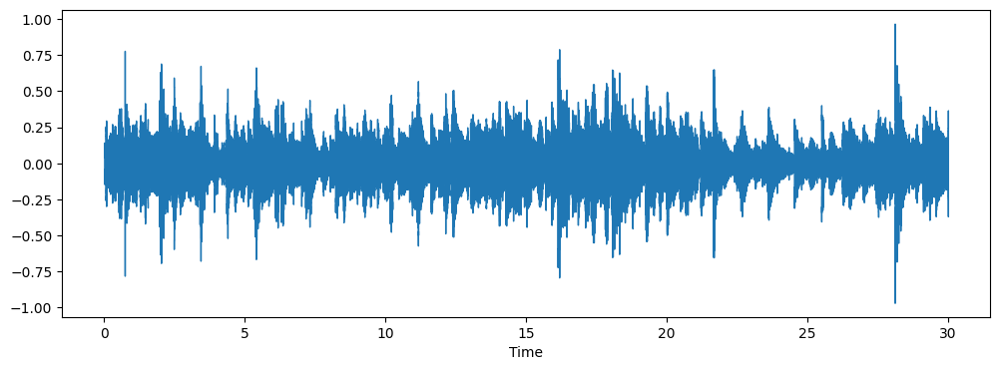

In [3]:
y,sr=librosa.load(file_name,sr=44100)
plt.figure(figsize=(12,4))
librosa.display.waveshow(y,sr=sr)
plt.show()

### Playing Sound

In [4]:
from IPython.display import Audio
Audio(data=y,rate=sr)

In [5]:
file_name_2="C:/Users/Administrator/Downloads/archive (25)/Data/genres_original/disco/disco.00094.wav"

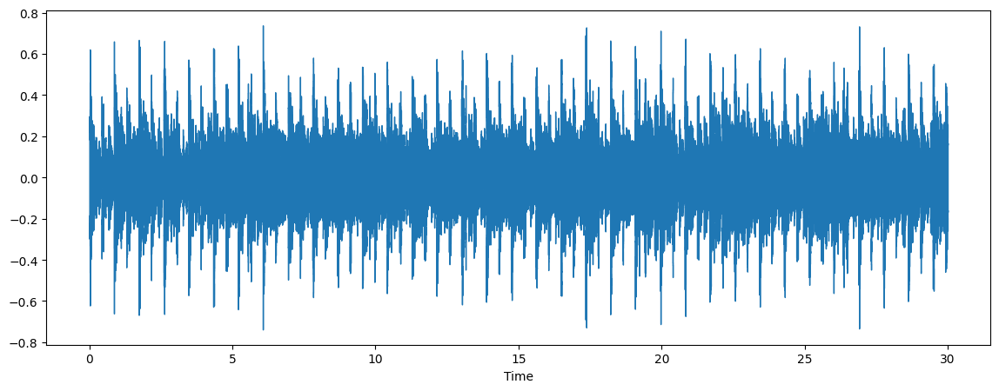

In [6]:
y1,sr1=librosa.load(file_name_2,sr=44100)
plt.figure(figsize=(14,5))
librosa.display.waveshow(y1,sr=sr1)
plt.show()

In [7]:
Audio(data=y1,rate=sr1)

### Doing visualization on chunks of audio

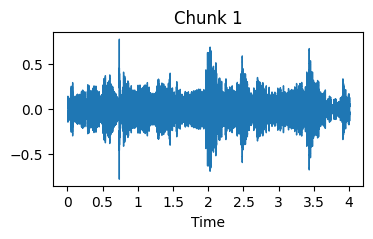

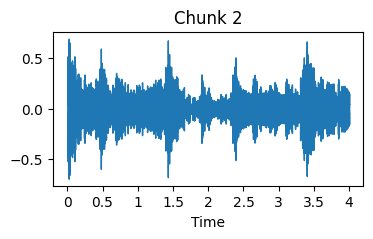

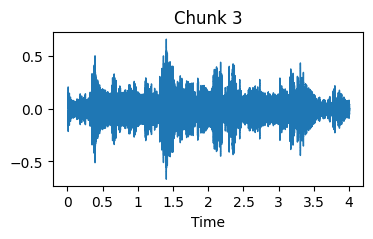

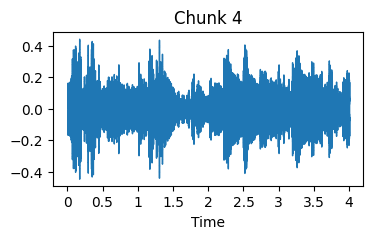

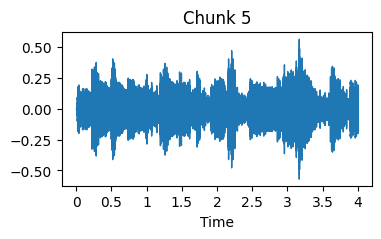

...

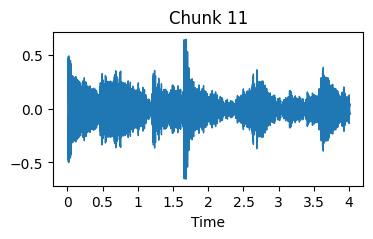

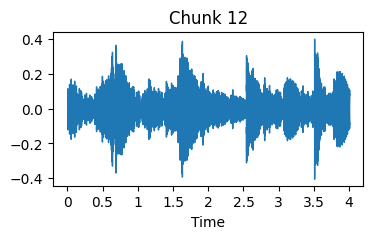

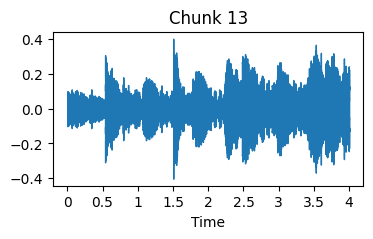

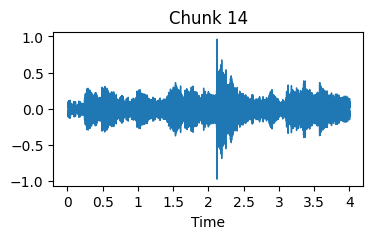

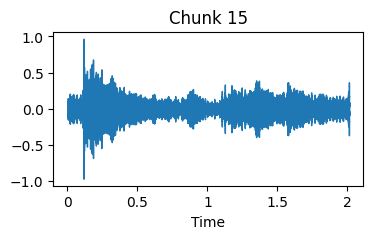

In [8]:
audio_path="C:/Users/Administrator/Downloads/archive (25)/Data/genres_original/blues/blues.00091.wav"
y,sr=librosa.load(audio_path,sr=None)  ### None means original sampling rate

## Defining duration of chunk and overlap
chunk_duration=4  ### in seconds
overlap_duration=2 ### in seconds

## Converting duration to samples
chunk_samples=chunk_duration*sr
overlap_samples=overlap_duration*sr

## Calculating total no of chunks in audio
num_chunks=int(np.ceil((len(y)-chunk_samples)/(chunk_samples-overlap_samples)))+1

## Iterating over chunks and plotting them
for i in range(num_chunks):
    ## Calculating start and end sample of chunk
    start=i*(chunk_samples-overlap_samples)
    end=start+chunk_samples
    chunk=y[start:end]
    plt.figure(figsize=(4,2))
    librosa.display.waveshow(chunk,sr=sr)
    plt.title(f"Chunk {i+1}")
    plt.show()


### Melspectrogram Visualization

In [9]:
### Plotting spectrogram of chunks
def plot_melspectrogram(y,sr):
    ### Computing spectrogram
    spectrogram=librosa.feature.melspectrogram(y=y,sr=sr)
    print(spectrogram.shape)
    ### Converting to dB(log scale)
    spectrogram_db=librosa.power_to_db(spectrogram,ref=np.max)
    ### Visualizing spectrogram
    plt.figure(figsize=(10,4))
    librosa.display.specshow(spectrogram_db,sr=sr,x_axis='time',y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel-frequency spectrogram')
    plt.tight_layout()
    plt.show()

(128, 1293)


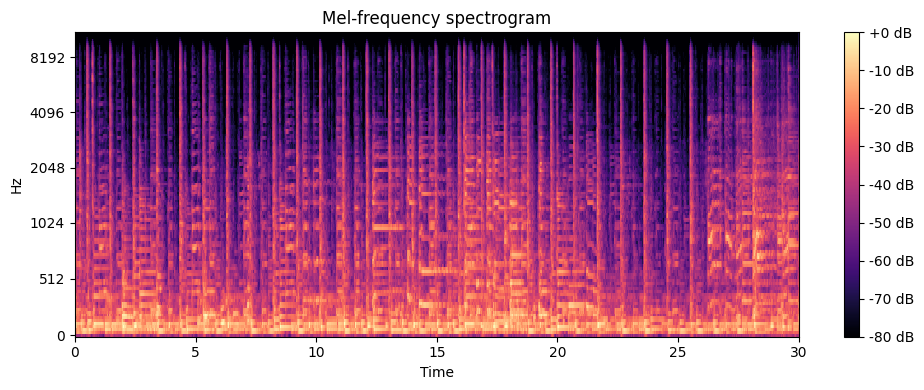

In [10]:
plot_melspectrogram(y,sr)

In [11]:
### Visualising Mel spectrogram of chunks
def plot_melspectrogram_chunks(y,sr):
    ## Defining duration of chunk and overlap
    chunk_duration=4  ### in seconds
    overlap_duration=2 ### in seconds

    ## Converting duration to samples
    chunk_samples=chunk_duration*sr
    overlap_samples=overlap_duration*sr

    ## Calculating total no of chunks in audio
    num_chunks=int(np.ceil((len(y)-chunk_samples)/(chunk_samples-overlap_samples)))+1

    ## Iterating over chunks and plotting them
    for i in range(num_chunks):
        ## Calculating start and end sample of chunk
        start=i*(chunk_samples-overlap_samples)
        end=start+chunk_samples
        chunk=y[start:end]
        ### Computing spectrogram
        spectrogram=librosa.feature.melspectrogram(y=chunk,sr=sr)
        print(spectrogram.shape)
        ### Converting to dB(log scale)
        spectrogram_db=librosa.power_to_db(spectrogram,ref=np.max)
        ### Visualizing spectrogram
        plt.figure(figsize=(10,4))
        librosa.display.specshow(spectrogram_db,sr=sr,x_axis='time',y_axis='mel')
        plt.colorbar(format='%+2.0f dB')
        plt.title(f'Mel-frequency spectrogram of Chunk {i+1}')
        plt.tight_layout()
        plt.show()
    

(128, 173)


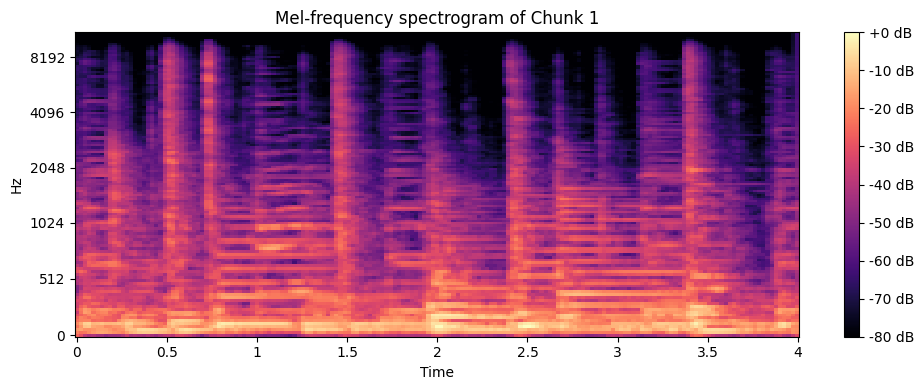

(128, 173)


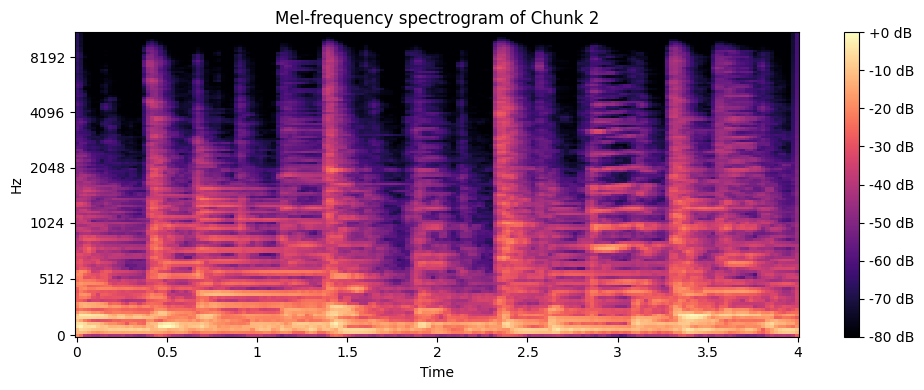

(128, 173)


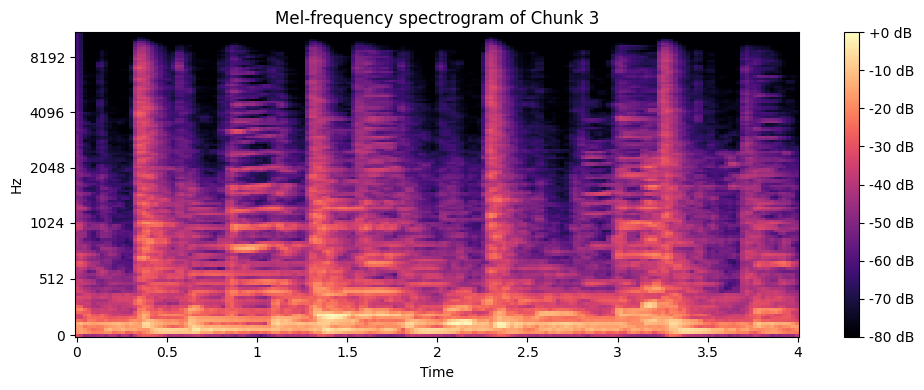

(128, 173)


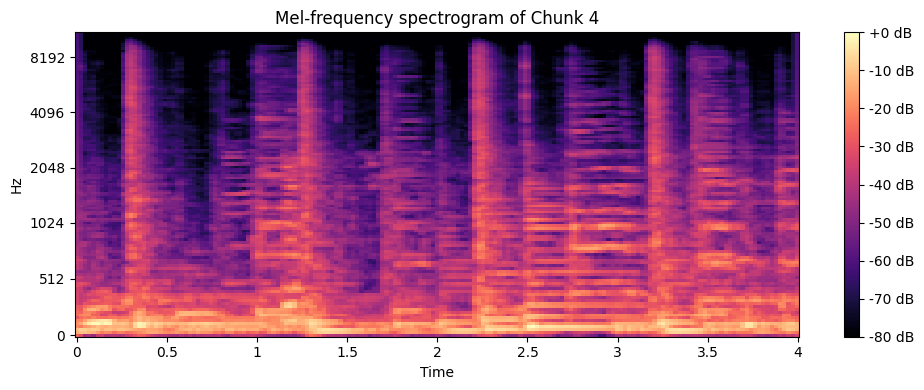

(128, 173)


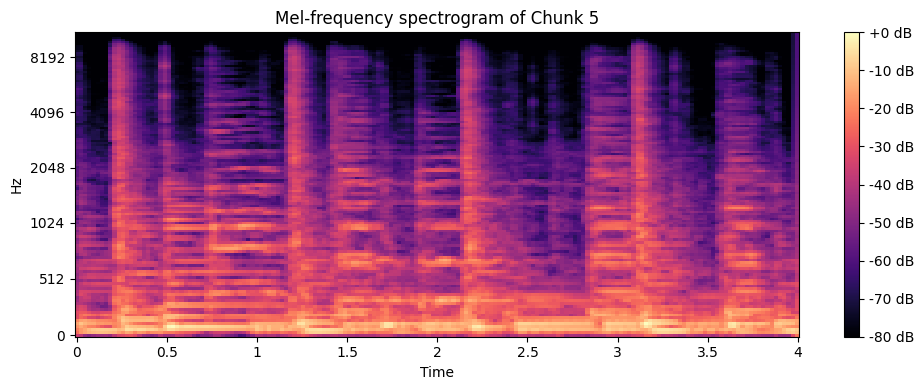

(128, 173)


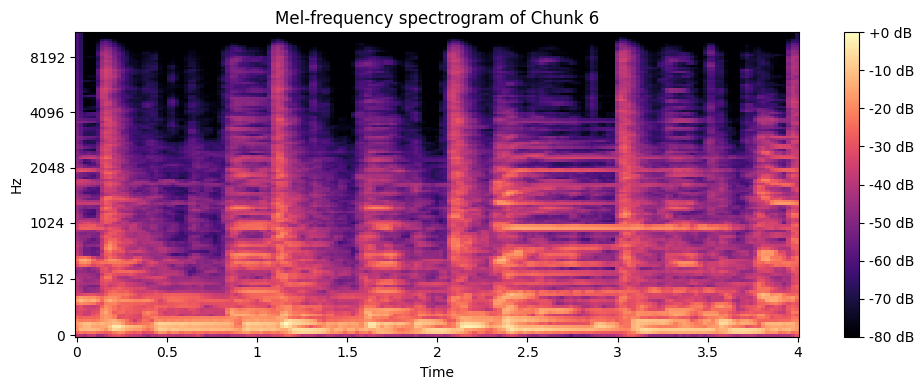

(128, 173)


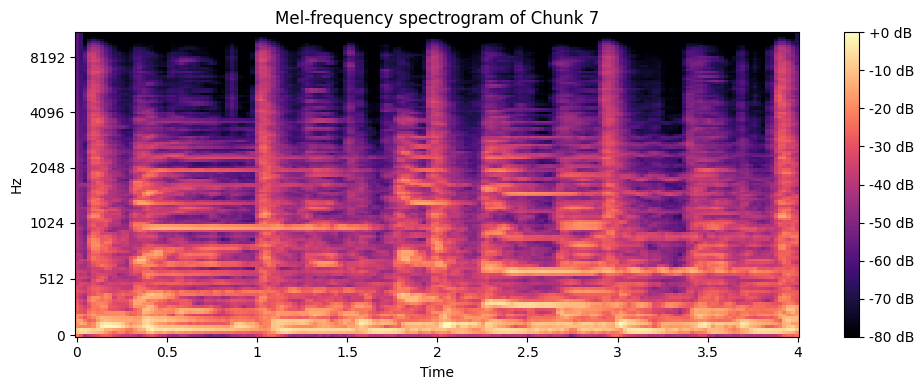

(128, 173)


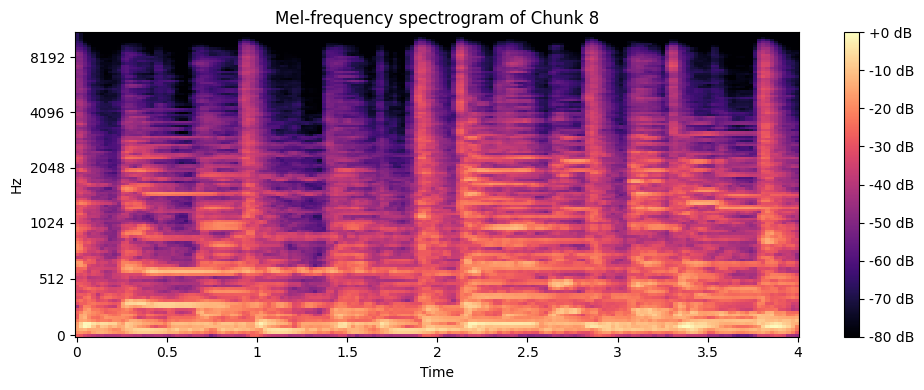

(128, 173)


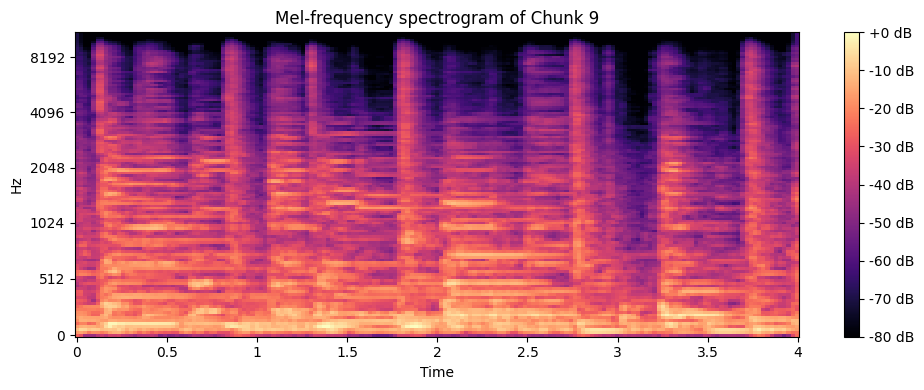

(128, 173)


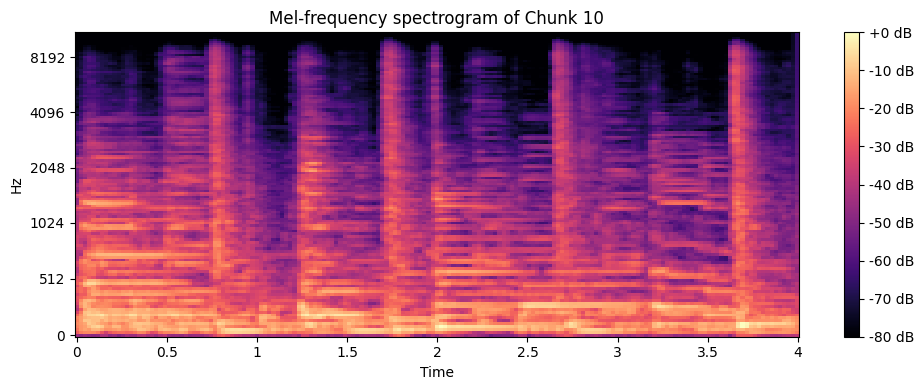

(128, 173)


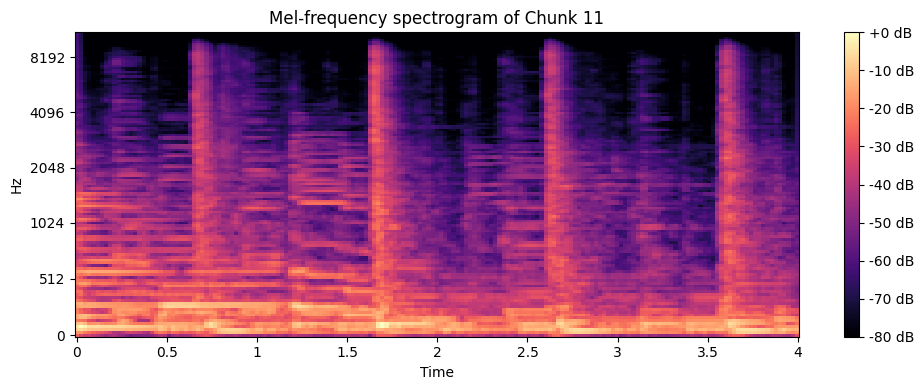

(128, 173)


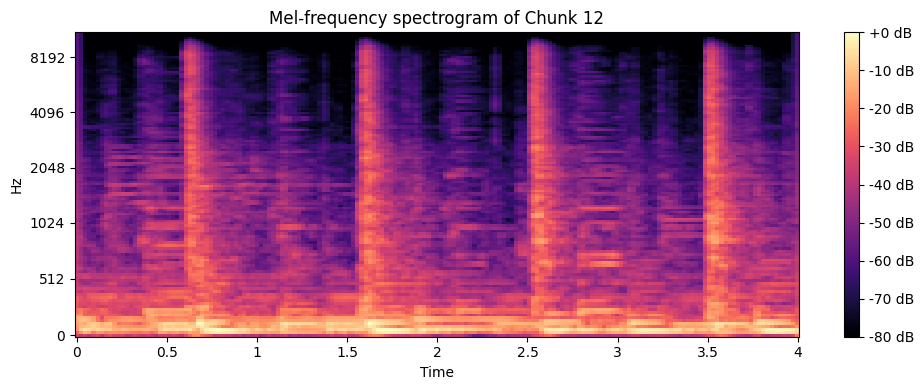

(128, 173)


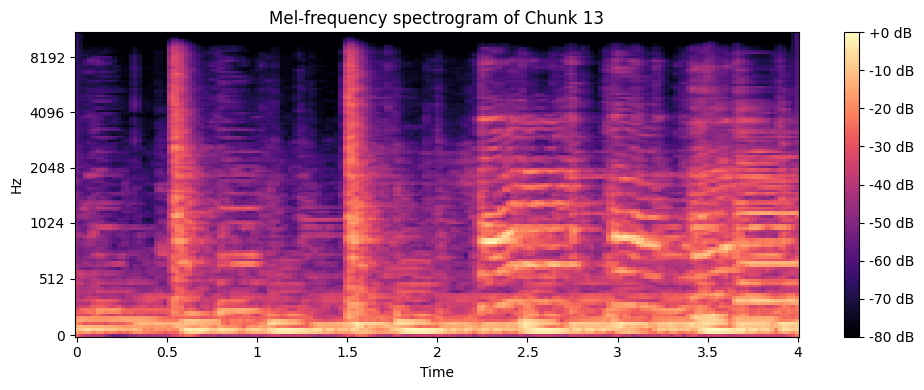

(128, 173)


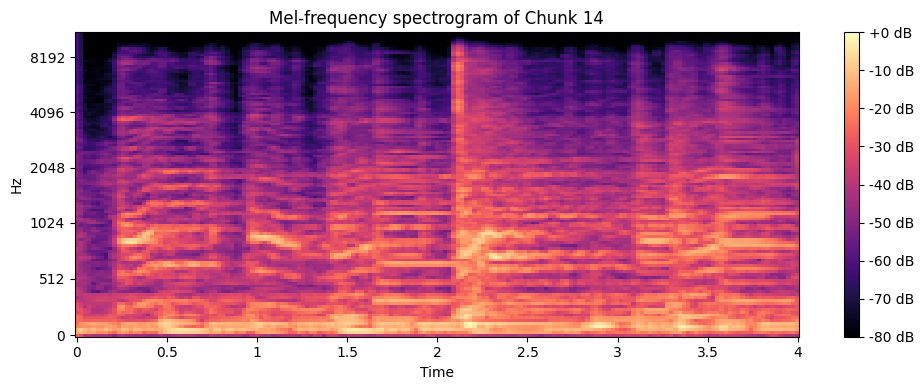

(128, 87)


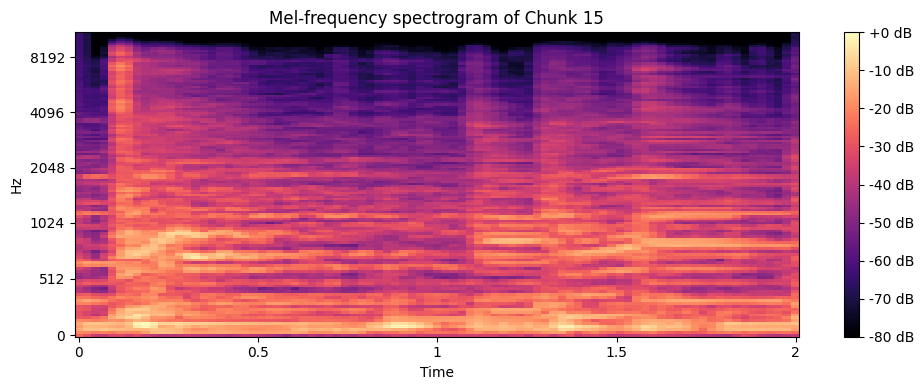

In [12]:
plot_melspectrogram_chunks(y,sr)

### Final data preprocessing

In [13]:
data_dir="C:/Users/Administrator/Downloads/archive (25)/Data/genres_original/"
classes=os.listdir(data_dir)
print(classes)

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


In [22]:
from tensorflow.image import resize
## Load and preprocess data
def load_and_preprocess_data(data_dir,classes,target_shape=(148,148)):
    data=[]
    labels=[]
    
    for i_class,class_name in enumerate(classes):
        class_dir=os.path.join(data_dir,class_name)
        print(f"Processing class: {class_name}")
        
        for file_name in os.listdir(class_dir):
            if file_name.endswith('.wav'):
                file_path=os.path.join(class_dir,file_name)
                try:
                    y, sr = librosa.load(file_path, sr=None)
                except Exception as e:
                    print("Skipping:", file_path, "| Error:", e)
                    continue

                
                ## Performing preprocessing
                
                ## Splitting audio into chunks
                chunk_duration=4
                overlap_duration=2
                chunk_samples=chunk_duration*sr
                overlap_samples=overlap_duration*sr
                num_chunks=int(np.ceil((len(y)-chunk_samples)/(chunk_samples-overlap_samples)))+1
                
                ## Iterating over chunks and plotting them
                for i in range(num_chunks):
                    ## Calculating start and end sample of chunk
                    start=i*(chunk_samples-overlap_samples)
                    end=start+chunk_samples
                    chunk=y[start:end]
                    '''plt.figure(figsize=(4,2))
                    librosa.display.waveshow(chunk,sr=sr)
                    plt.title(f"Chunk {i+1}")
                    plt.show()'''
                    
                    ## Computing spectrogram
                    mel_spectrogram=librosa.feature.melspectrogram(y=chunk,sr=sr)
                    
                    ## Resizing spectrogram to target shape
                    mel_spectrogram_resized=resize(np.expand_dims(mel_spectrogram,axis=-1),target_shape)
                    
                    data.append(mel_spectrogram_resized)
                    labels.append(i_class)
        
    return np.array(data),np.array(labels)                    
                

In [23]:
data,labels=load_and_preprocess_data(data_dir,classes)

Processing class: blues
Processing class: classical
Processing class: country
Processing class: disco
Processing class: hiphop
Processing class: jazz


C:\Users\Administrator\AppData\Local\Temp\ipykernel_18964\659235703.py:15: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=None)


Skipping: C:/Users/Administrator/Downloads/archive (25)/Data/genres_original/jazz\jazz.00054.wav | Error: 
Processing class: metal
Processing class: pop
Processing class: reggae
Processing class: rock


In [25]:
print(data.shape)
print('\n')
print(labels.shape)

(14975, 148, 148, 1)


(14975,)


In [ ]:
from tensorflow.keras.utils import to_categorical
labels=to_categorical(labels,num_classes=len(classes))  ## Converting to one-hot encoding
labels

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], shape=(14975, 10))

In [27]:
### Splitting data into train and test
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(data,labels,test_size=0.2,random_state=42,stratify=labels)

In [28]:
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((11980, 148, 148, 1), (2995, 148, 148, 1), (11980, 10), (2995, 10))

### Building the model

In [30]:
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Flatten,Dense,Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

In [32]:
model=Sequential([
    Conv2D(32,(3,3),padding='same',activation='relu',input_shape=X_train[0].shape),
    Conv2D(32,(3,3),activation='relu'),
    MaxPooling2D((2,2),strides=(2,2)),
    Conv2D(64,(3,3),padding='same',activation='relu'),
    Conv2D(64,(3,3),activation='relu'),
    MaxPooling2D((2,2)),
    Conv2D(128,(3,3),padding='same',activation='relu'),
    Conv2D(128,(3,3),activation='relu'),
    MaxPooling2D((2,2)),
    Dropout(0.3),
    Conv2D(256,(3,3),padding='same',activation='relu'),
    Conv2D(256,(3,3),activation='relu'),
    MaxPooling2D((2,2)),
    Conv2D(512,(3,3),padding='same',activation='relu'),
    Conv2D(512,(3,3),activation='relu'),
    MaxPooling2D((2,2)),
    Flatten(),
    Dense(1200,activation='relu'),
    Dropout(0.45),
    Dense(len(classes),activation='softmax')
])

C:\Users\Administrator\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [33]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 146, 146, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 73, 73, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 73, 73, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 71, 71, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 35, 35, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 35, 35, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 33, 33, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 14, 14, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 7, 7, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 5, 5, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1200)           │     2,458,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │        12,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,182,458 (27.40 MB)

 Trainable params: 7,182,458 (27.40 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
### Compiling the model
model.compile(optimizer=Adam(learning_rate=0.0001),loss='categorical_crossentropy',metrics=['accuracy'])

In [36]:
## Training the model
history=model.fit(X_train,y_train,epochs=15,batch_size=32,validation_data=(X_test,y_test))

Epoch 1/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 190s 506ms/step - accuracy: 0.9353 - loss: 0.1925 - val_accuracy: 0.8427 - val_loss: 0.5015
Epoch 2/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 190s 507ms/step - accuracy: 0.9478 - loss: 0.1552 - val_accuracy: 0.8691 - val_loss: 0.4906
Epoch 3/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 190s 508ms/step - accuracy: 0.9536 - loss: 0.1407 - val_accuracy: 0.8678 - val_loss: 0.4513
Epoch 4/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 191s 509ms/step - accuracy: 0.9593 - loss: 0.1157 - val_accuracy: 0.8881 - val_loss: 0.4181
Epoch 5/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 191s 510ms/step - accuracy: 0.9651 - loss: 0.1075 - val_accuracy: 0.8464 - val_loss: 0.5504
Epoch 6/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 192s 511ms/step - accuracy: 0.9682 - loss: 0.0949 - val_accuracy: 0.8925 - val_loss: 0.3859
Epoch 7/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 191s 508ms/step - accuracy: 0.9716 - loss: 0.0854 - val_accuracy: 0.8995 - val_loss: 0.4111
Epoch 8/15
375/375 ━━━━━━━━━━━━━━━━━━━━ 191s 510ms/step - accuracy: 0.9732 -

In [40]:
model.save("C:/Users/Administrator/Downloads/archive (25)/music_genre_classification_model.h5")

In [38]:
history.history

{'accuracy': [0.9353088736534119,
  0.9478297233581543,
  0.9535893201828003,
  0.9592654705047607,
  0.9651085138320923,
  0.9681969881057739,
  0.9716193675994873,
  0.9732053279876709,
  0.9763773083686829,
  0.973789632320404,
  0.9800500869750977,
  0.9810517430305481,
  0.9821369051933289,
  0.982721209526062,
  0.9817195534706116],
 'loss': [0.19251218438148499,
  0.15520404279232025,
  0.14068828523159027,
  0.11572711169719696,
  0.1074657216668129,
  0.09492624551057816,
  0.08539043366909027,
  0.08107463270425797,
  0.07165177166461945,
  0.08345991373062134,
  0.061055999249219894,
  0.0575883612036705,
  0.05719875171780586,
  0.05216946825385094,
  0.053473517298698425],
 'val_accuracy': [0.8427379131317139,
  0.8691151738166809,
  0.8677796125411987,
  0.8881469368934631,
  0.8464106917381287,
  0.8924874663352966,
  0.8994991779327393,
  0.8984975218772888,
  0.8978297114372253,
  0.8994991779327393,
  0.8874791264533997,
  0.9028380513191223,
  0.8958263993263245,
  0

In [41]:
import json
save_path='C:/Users/Administrator/Downloads/archive (25)/training_history.json'
with open(save_path,'w') as f:
    json.dump(history.history,f)

In [42]:
## Reloading the model
from tensorflow.keras.models import load_model
#reloaded_model=load_model("C:/Users/Administrator/Downloads/archive (25)/music_genre_classification_model.h5")
with open('C:/Users/Administrator/Downloads/archive (25)/training_history.json','r') as f:
    history=json.load(f)

In [43]:
history

{'accuracy': [0.9353088736534119,
  0.9478297233581543,
  0.9535893201828003,
  0.9592654705047607,
  0.9651085138320923,
  0.9681969881057739,
  0.9716193675994873,
  0.9732053279876709,
  0.9763773083686829,
  0.973789632320404,
  0.9800500869750977,
  0.9810517430305481,
  0.9821369051933289,
  0.982721209526062,
  0.9817195534706116],
 'loss': [0.19251218438148499,
  0.15520404279232025,
  0.14068828523159027,
  0.11572711169719696,
  0.1074657216668129,
  0.09492624551057816,
  0.08539043366909027,
  0.08107463270425797,
  0.07165177166461945,
  0.08345991373062134,
  0.061055999249219894,
  0.0575883612036705,
  0.05719875171780586,
  0.05216946825385094,
  0.053473517298698425],
 'val_accuracy': [0.8427379131317139,
  0.8691151738166809,
  0.8677796125411987,
  0.8881469368934631,
  0.8464106917381287,
  0.8924874663352966,
  0.8994991779327393,
  0.8984975218772888,
  0.8978297114372253,
  0.8994991779327393,
  0.8874791264533997,
  0.9028380513191223,
  0.8958263993263245,
  0

In [44]:
history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

### Model Evaluation

In [47]:
## Model Evaluation on train set
train_loss,train_acc=model.evaluate(X_train,y_train)
train_loss,train_acc

375/375 ━━━━━━━━━━━━━━━━━━━━ 53s 142ms/step - accuracy: 0.9923 - loss: 0.0244


(0.02443532831966877, 0.9923205375671387)

In [46]:
val_loss, val_acc=model.evaluate(X_test,y_test)
val_loss,val_acc

94/94 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - accuracy: 0.8982 - loss: 0.4519


(0.4518987238407135, 0.8981636166572571)

## Accuracy and Loss Visualisation

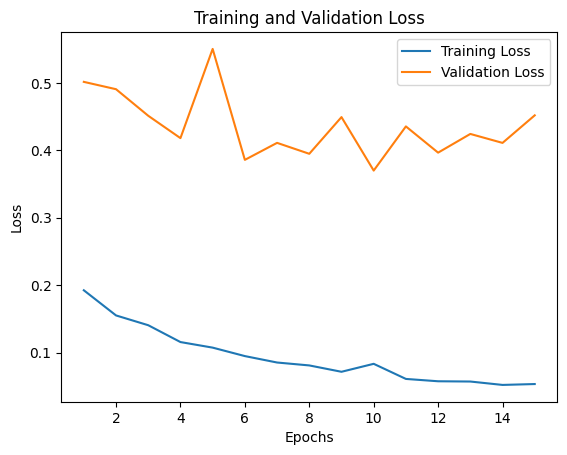

In [48]:
epochs=[i for i in range(1,16)]
plt.plot(epochs,history['loss'],label='Training Loss')
plt.plot(epochs,history['val_loss'],label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

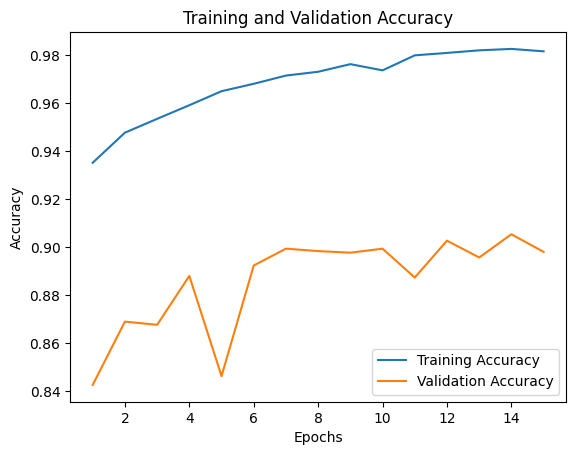

In [49]:
epochs=[i for i in range(1,16)]
plt.plot(epochs,history['accuracy'],label='Training Accuracy')
plt.plot(epochs,history['val_accuracy'],label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

### Precision, Recall and F1-Score

In [50]:
y_pred=model.predict(X_test)
y_pred

94/94 ━━━━━━━━━━━━━━━━━━━━ 21s 222ms/step


array([[9.9999249e-01, 1.9141909e-13, 5.5648488e-06, ..., 1.8907892e-06,
        5.3205274e-10, 2.0922708e-09],
       [3.1449811e-06, 2.2648433e-06, 9.7743040e-01, ..., 4.7437490e-05,
        2.3284698e-05, 1.5165073e-02],
       [3.3728316e-05, 4.2822242e-07, 5.6286985e-06, ..., 3.8859987e-05,
        6.8745620e-05, 1.9775762e-04],
       ...,
       [1.8743161e-06, 3.3204961e-07, 1.7876428e-04, ..., 7.2586707e-05,
        2.7567050e-05, 4.9450529e-07],
       [5.4616322e-07, 6.1782548e-09, 6.2907204e-09, ..., 5.2475013e-08,
        8.3541893e-09, 2.7510666e-04],
       [2.7540593e-06, 1.0113334e-03, 7.0157921e-07, ..., 2.6494761e-05,
        2.3157359e-06, 9.8573864e-01]], shape=(2995, 10), dtype=float32)

In [51]:
y_pred_classes=np.argmax(y_pred,axis=1)
y_pred_classes

array([0, 2, 3, ..., 5, 6, 9], shape=(2995,))

In [52]:
classes

['blues',
 'classical',
 'country',
 'disco',
 'hiphop',
 'jazz',
 'metal',
 'pop',
 'reggae',
 'rock']

In [53]:
from sklearn.metrics import classification_report,confusion_matrix
y_true=np.argmax(y_test,axis=1)
cm=confusion_matrix(y_true,y_pred_classes)
cm

array([[268,   0,   8,   1,   1,   4,   1,   4,   1,  12],
       [  2, 289,   1,   0,   1,   6,   0,   1,   0,   0],
       [  6,   0, 258,   0,   0,   5,   0,   7,   2,  21],
       [  1,   5,   3, 249,   5,   1,   1,   4,   0,  31],
       [  0,   1,   0,   1, 281,   2,   6,   4,   2,   3],
       [  3,   7,   6,   0,   0, 276,   2,   1,   1,   1],
       [  0,   0,   0,   0,   0,   0, 291,   1,   0,   8],
       [  1,   0,   6,   3,   7,   1,   1, 267,   0,  14],
       [ 10,   2,  13,   5,   5,   5,   0,   9, 241,  10],
       [  4,   1,   7,   0,   0,   1,  11,   5,   0, 270]])

In [56]:
y_true

array([0, 2, 3, ..., 5, 6, 3], shape=(2995,))

In [58]:
y_pred_classes

array([0, 2, 3, ..., 5, 6, 9], shape=(2995,))

In [61]:
ClassificationReport=classification_report(y_true,y_pred_classes,target_names=classes)
print(ClassificationReport)

              precision    recall  f1-score   support

       blues       0.91      0.89      0.90       300
   classical       0.95      0.96      0.96       300
     country       0.85      0.86      0.86       299
       disco       0.96      0.83      0.89       300
      hiphop       0.94      0.94      0.94       300
        jazz       0.92      0.93      0.92       297
       metal       0.93      0.97      0.95       300
         pop       0.88      0.89      0.89       300
      reggae       0.98      0.80      0.88       300
        rock       0.73      0.90      0.81       299

    accuracy                           0.90      2995
   macro avg       0.90      0.90      0.90      2995
weighted avg       0.90      0.90      0.90      2995



### Confusion Matrix Visualization

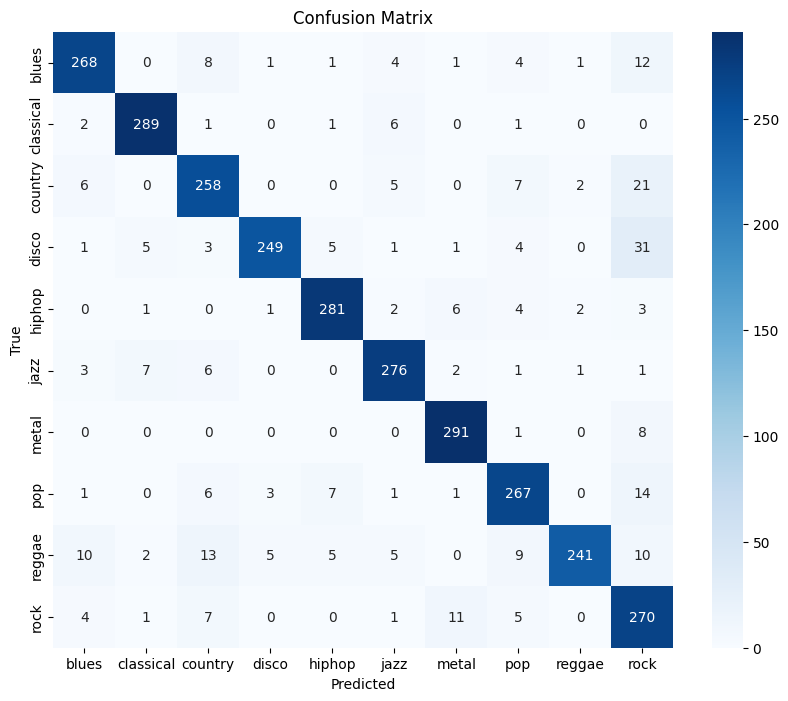

In [63]:
import seaborn as sns
plt.figure(figsize=(10,8))
sns.heatmap(cm,annot=True,fmt='d',xticklabels=classes,yticklabels=classes,cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [64]:
model=tf.keras.models.load_model("C:/Users/Administrator/Downloads/archive (25)/music_genre_classification_model.h5")
model

<Sequential name=sequential, built=True>

### Single Audio Preprocessing

In [65]:
## Loading and preprocessing a single audio file for prediction
def load_and_preprocess_file(file_path,target_shape=(148,148)):
    try:
        y,sr=librosa.load(file_path,sr=None)
    except Exception as e:
        print("Error loading file:",file_path,"| Error:",e)
        return None
    
    chunk_duration=4
    overlap_duration=2
    chunk_samples=chunk_duration*sr
    overlap_samples=overlap_duration*sr
    num_chunks=int(np.ceil((len(y)-chunk_samples)/(chunk_samples-overlap_samples)))+1
    
    data=[]
    
    for i in range(num_chunks):
        start=i*(chunk_samples-overlap_samples)
        end=start+chunk_samples
        chunk=y[start:end]
        
        mel_spectrogram=librosa.feature.melspectrogram(y=chunk,sr=sr)
        mel_spectrogram_resized=resize(np.expand_dims(mel_spectrogram,axis=-1),target_shape)
        
        data.append(mel_spectrogram_resized)
    
    return np.array(data)

In [66]:
path_to_file="C:/Users/Administrator/Downloads/rock-intro-335249.mp3"
X_test=load_and_preprocess_file(path_to_file)
X_test

array([[[[1.92011728e-12],
         [5.29988711e-08],
         [7.22964705e-06],
         ...,
         [2.09184766e-01],
         [2.16037363e-01],
         [1.06735528e+00]],

        [[2.75060833e-12],
         [4.21909959e-07],
         [4.81220603e-04],
         ...,
         [2.71676369e+01],
         [2.82689896e+01],
         [2.61826057e+01]],

        [[2.57299390e-12],
         [7.34168850e-07],
         [1.47331739e-03],
         ...,
         [4.45833817e+01],
         [4.98620300e+01],
         [5.02220001e+01]],

        ...,

        [[1.17842691e-16],
         [4.80521113e-13],
         [2.78526984e-13],
         ...,
         [4.36801637e-11],
         [3.63446252e-11],
         [6.33628042e-06]],

        [[5.81812321e-19],
         [7.53027876e-15],
         [8.73462611e-14],
         ...,
         [4.09399285e-11],
         [4.73161406e-11],
         [6.26687824e-06]],

        [[1.88097273e-18],
         [2.27486283e-14],
         [1.91903527e-13],
         ...,
 

In [67]:
X_test.shape

(8, 148, 148, 1)

### Playing Sound

In [69]:
y,sr=librosa.load(path_to_file,sr=44100)
Audio(data=y,rate=sr)

### Model Prediction

In [92]:
def model_prediction(X_test):
    y_pred=model.predict(X_test)
    predicted_categories=np.argmax(y_pred,axis=1)
    unique,counts=np.unique(predicted_categories,return_counts=True)
    max_count=np.max(counts)
    max_elements=unique[counts==max_count]
    return predicted_categories,unique,counts,int(max_count),int(max_elements[0])

In [95]:
model_prediction(X_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


(array([9, 9, 9, 9, 9, 9, 9, 1]), array([1, 9]), array([1, 7]), 7, 9)

In [79]:
classes[9]

'rock'

In [96]:
print("Model prediction : Music Genre is :: ",classes[9])

Model prediction : Music Genre is ::  rock
